In [1]:
#import of relevant libraries
import numpy as np
import pandas as pd
import requests
import hashlib
import time
import matplotlib.pyplot as plt
from scipy.stats import linregress
import seaborn as sns

# #importing keys for API call
# from config import m_key
# from config import mp_key

# #creating varaibles for params
# timestamp = str(time.time())
# hashes = hashlib.md5((timestamp+mp_key+m_key).encode()).hexdigest()

# #API call parameters
# params = {
#     'apikey':m_key,
#     'ts':timestamp,
#     'hash': hashes,
#     'limit':100,
#     'offset': 0
# }

# #url for characters
# url = f'https://gateway.marvel.com/v1/public/characters'


In [2]:
#list to record API results
character_data = []

#loops to grab character data from Marvel API
for i in range(15):
    response = requests.get(url,params)
    data = response.json()
    character_data.append(data)
    params['offset'] += 100
    
character_data

[{'code': 200,
  'status': 'Ok',
  'copyright': '© 2020 MARVEL',
  'attributionText': 'Data provided by Marvel. © 2020 MARVEL',
  'attributionHTML': '<a href="http://marvel.com">Data provided by Marvel. © 2020 MARVEL</a>',
  'etag': '7391053726be894a5252fb782ed4ee72bb56440f',
  'data': {'offset': 0,
   'limit': 100,
   'total': 1493,
   'count': 100,
   'results': [{'id': 1011334,
     'name': '3-D Man',
     'description': '',
     'modified': '2014-04-29T14:18:17-0400',
     'thumbnail': {'path': 'http://i.annihil.us/u/prod/marvel/i/mg/c/e0/535fecbbb9784',
      'extension': 'jpg'},
     'resourceURI': 'http://gateway.marvel.com/v1/public/characters/1011334',
     'comics': {'available': 12,
      'collectionURI': 'http://gateway.marvel.com/v1/public/characters/1011334/comics',
      'items': [{'resourceURI': 'http://gateway.marvel.com/v1/public/comics/21366',
        'name': 'Avengers: The Initiative (2007) #14'},
       {'resourceURI': 'http://gateway.marvel.com/v1/public/comics/24

In [3]:
#defining lists to create dataframe for Marvel Character Data
ids = []
names = []
comic_count = []
series_count = []
story_count = []
event_count = []

#loops through our json results from Marvel API call loop
for x in range(len(character_data)):
    
    for i in range(len(character_data[x]['data']['results'])):
        ids.append(character_data[x]['data']['results'][i]['id'])
        names.append(character_data[x]['data']['results'][i]['name'])
        comic_count.append(character_data[x]['data']['results'][i]['comics']['available'])
        series_count.append(character_data[x]['data']['results'][i]['series']['available'])
        story_count.append(character_data[x]['data']['results'][i]['stories']['available'])
        event_count.append(character_data[x]['data']['results'][i]['events']['available'])
     


In [4]:
#defining dictionary and creating pandas dataframe
char_data = {
    'character_id': ids,
    'character_name': names,
    'num_of_comics': comic_count,
    'num_of_series': series_count,
    'num_of_stories': story_count,
    'num_of_events': event_count
}

marvel_char_data_df = pd.DataFrame(char_data)


#helps see stats for our data
marvel_char_data_df.describe()

,character_id,num_of_comics,num_of_series,num_of_stories,num_of_events
count,1.493000e+03,1493.000000,1493.000000,1493.000000,1493.000000
mean,1.010906e+06,59.006698,19.029471,75.734092,1.817816
std,1.911881e+03,220.402596,59.423395,318.568612,4.286681
min,1.009144e+06,0.000000,0.000000,0.000000,0.000000
25%,1.009548e+06,1.000000,1.000000,1.000000,0.000000
50%,1.010812e+06,10.000000,4.000000,11.000000,0.000000
75%,1.011188e+06,38.000000,15.000000,43.000000,2.000000
max,1.017840e+06,3918.000000,989.000000,5898.000000,42.000000


In [5]:
# filters dataframe to include only characters with the number of comics 
marvel_char_data_df = marvel_char_data_df.sort_values('num_of_comics', ascending = False)
marvel_char_data_df = marvel_char_data_df[(marvel_char_data_df.num_of_comics != 0 )]

In [6]:
# Filters dataframe to include only characters who are in events
marvel_char_data_df = marvel_char_data_df[(marvel_char_data_df.num_of_events != 0 )]
marvel_char_data_df.sort_values('num_of_events', ascending = False)

# Downcasting our data to save space
marvel_char_data_df['character_id'] = pd.to_numeric(marvel_char_data_df['character_id'],downcast='integer')
marvel_char_data_df['num_of_comics'] = pd.to_numeric(marvel_char_data_df['num_of_comics'],downcast='integer')
marvel_char_data_df['num_of_series'] = pd.to_numeric(marvel_char_data_df['num_of_series'],downcast='integer')
marvel_char_data_df['num_of_stories'] = pd.to_numeric(marvel_char_data_df['num_of_stories'],downcast='integer')
marvel_char_data_df['num_of_events'] = pd.to_numeric(marvel_char_data_df['num_of_events'],downcast='integer')

#export data to csv
marvel_char_data_df.to_csv('api_output/api_output.csv')
marvel_char_data_df.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 660 entries, 1185 to 67
Data columns (total 6 columns):
character_id      660 non-null int32
character_name    660 non-null object
num_of_comics     660 non-null int16
num_of_series     660 non-null int16
num_of_stories    660 non-null int16
num_of_events     660 non-null int8
dtypes: int16(3), int32(1), int8(1), object(1)
memory usage: 17.4+ KB


In [13]:
marvel_char_data_df

,character_id,character_name,num_of_comics,num_of_series,num_of_stories,num_of_events
1185,1009610,Spider-Man,3918,989,5898,38
1472,1009726,X-Men,3432,828,5092,42
573,1009368,Iron Man,2561,626,3880,31
1453,1009718,Wolverine,2470,663,3457,42
185,1009220,Captain America,2362,651,3503,31
...,...,...,...,...,...,...
706,1011145,Lord Hawal,1,1,1,1
1372,1010987,Unus (Age of Apocalypse),1,1,1,1
1068,1010970,Sabretooth (House of M),1,1,1,1
1073,1011156,Salo,1,1,1,1


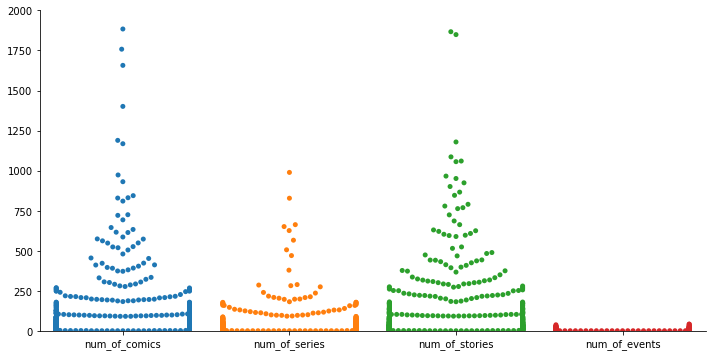

In [7]:
# seaborn catplot to show data distribution of each relevant df column
sns_plot = sns.catplot(data=marvel_char_data_df[['num_of_comics', 'num_of_series', 'num_of_stories','num_of_events']],aspect=2,kind='swarm')
sns_plot.set(ylim=(0,2000))
top_plot.set_title('Content Distribution')

# saves chart as png
sns_plot.savefig("charts/data_distribution.png")

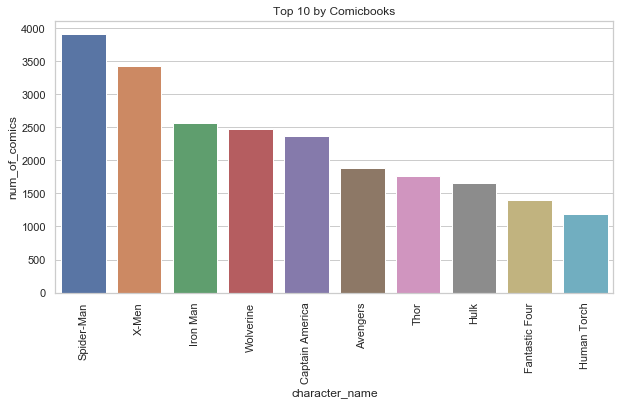

In [8]:
# barplot to show top 10 characters by comicbook amount
sns.set(style="whitegrid")
fig, ax = plt.subplots(figsize=(10,5))
top_plot = sns.barplot(x="character_name", y="num_of_comics", 
                 data=marvel_char_data_df.sort_values('num_of_comics',ascending=False).head(10),ax=ax)
top_plot.set_title('Top 10 by Comicbooks')
top_plot.set_xticklabels(top_plot.get_xticklabels(), rotation=90)

# saves chart as png
plt.savefig('charts/top_ten_by_comic.png')

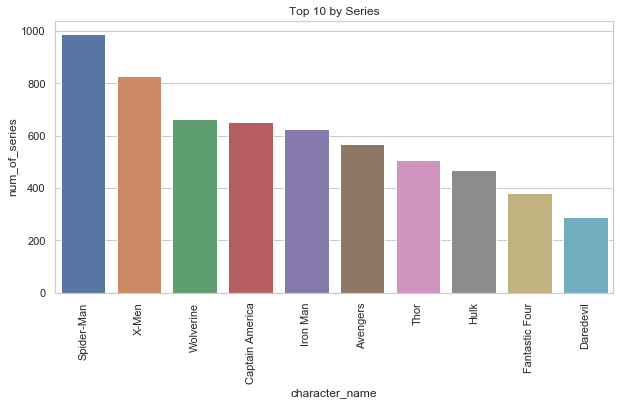

In [9]:
# barchart to show top 10 characters by series amount
sns.set(style="whitegrid")
fig, ax = plt.subplots(figsize=(10,5))
top_plot = sns.barplot(x="character_name", y="num_of_series", 
                 data=marvel_char_data_df.sort_values('num_of_series',ascending=False).head(10),ax=ax)
top_plot.set_title('Top 10 by Series')
top_plot.set_xticklabels(top_plot.get_xticklabels(), rotation=90)

# saves chart as png
plt.savefig('charts/top_ten_by_series.png')

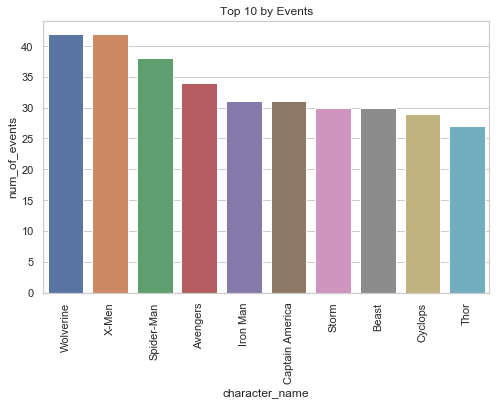

In [10]:
# barchart to show top 10 characters by events
sns.set(style="whitegrid")
fig, ax = plt.subplots(figsize=(8,5))
top_plot = sns.barplot(x="character_name", y="num_of_events", 
                 data=marvel_char_data_df.sort_values('num_of_events',ascending=False).head(10),ax=ax)
top_plot.set_title('Top 10 by Events')
top_plot.set_xticklabels(top_plot.get_xticklabels(), rotation=90)
plt.savefig('charts/top_ten_by_event.png')

The r-squared is: 0.8568303798251373


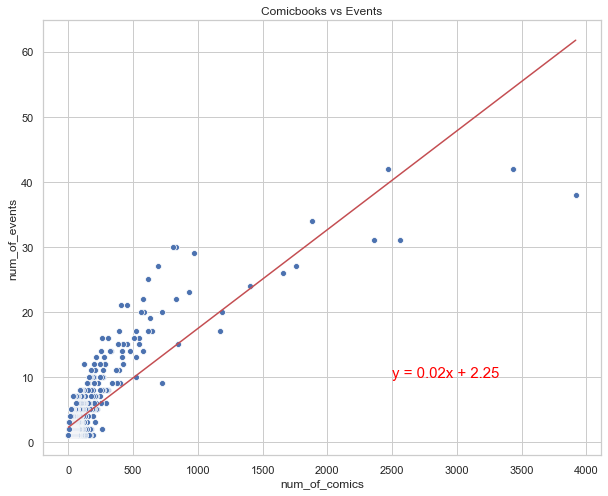

In [11]:
# defines linear regression equation and line to plot
x_values = marvel_char_data_df.num_of_comics
y_values = marvel_char_data_df.num_of_events
(slope, intercept, rvalue, pvalue, stderr) = linregress(x_values, y_values)
regress_values = x_values * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))

# chart to show correlation between comics and events
fig, ax = plt.subplots(figsize=(10,8))
cmap = sns.cubehelix_palette(rot=-.2,as_cmap=True)
ax = sns.scatterplot(x="num_of_comics", y="num_of_events", 
                     palette=cmap, sizes=(10, 200), 
                     data=marvel_char_data_df,ax=ax)
ax.set_title('Comicbooks vs Events')
plt.plot(x_values,regress_values,"r-")
plt.annotate(line_eq,(2500,10),fontsize=15,color="red")
print(f"The r-squared is: {rvalue}")

# saves chart as png
plt.savefig('charts/comic_event_correlation.png')

The r-squared is: 0.9887123917887364


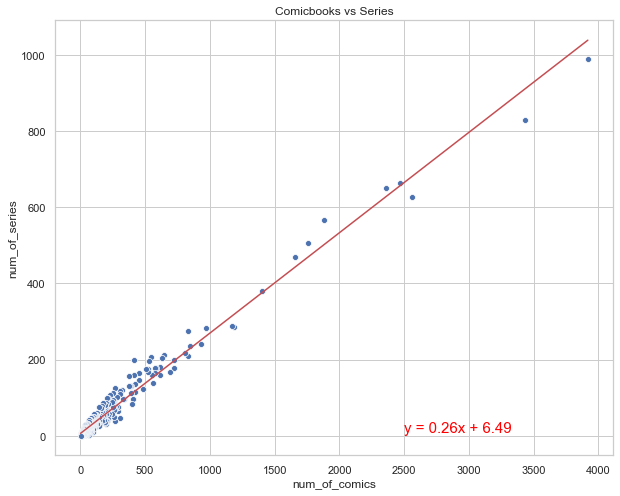

In [12]:
# defines linear regression equation and line to plot
x_values = marvel_char_data_df.num_of_comics
y_values = marvel_char_data_df.num_of_series
(slope, intercept, rvalue, pvalue, stderr) = linregress(x_values, y_values)
regress_values = x_values * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))


#  chart to show correlation between comicbooks and series
fig, ax = plt.subplots(figsize=(10,8))
cmap = sns.cubehelix_palette(rot=-.2, as_cmap=True)
ax = sns.scatterplot(x="num_of_comics", y="num_of_series", 
                     palette=cmap, sizes=(10, 200), 
                     data=marvel_char_data_df)
ax.set_title('Comicbooks vs Series')
plt.plot(x_values,regress_values,"r-")
plt.annotate(line_eq,(2500,10),fontsize=15,color="red")
print(f"The r-squared is: {rvalue}")

#saves to png
plt.savefig('charts/comic_series_correlation.png')